# DiffEq Solutions

## Solution to the Lorenz Problem

In [1]:
using DifferentialEquations

f = @ode_def_nohes LorenzExample begin
  dx = σ*(y-x)
  dy = x*(ρ-z) - y
  dz = x*y - β*z
end σ ρ β

u0 = big.([0.1;0.0;0.0])
tspan = (big(0.0),big(100.0))
prob = ODEProblem(f,u0,tspan,(10.0,28.0,2.6666))
sol = solve(prob);

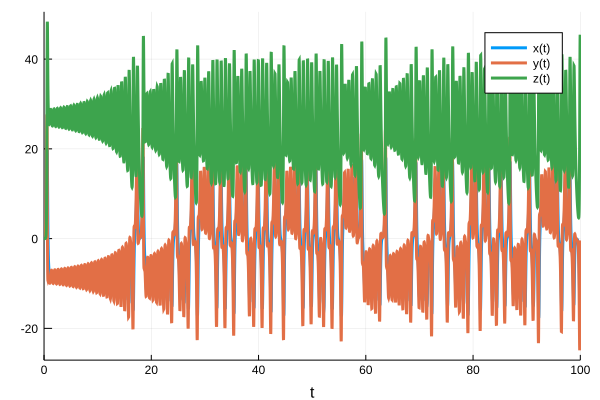

In [2]:
using Plots; gr(); plot(sol)

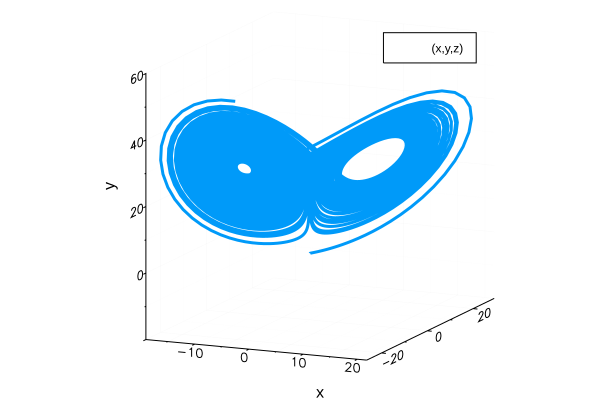

In [3]:
plot(sol,vars=(:x,:y,:z))

## Solution to the Ball Bounce Problem

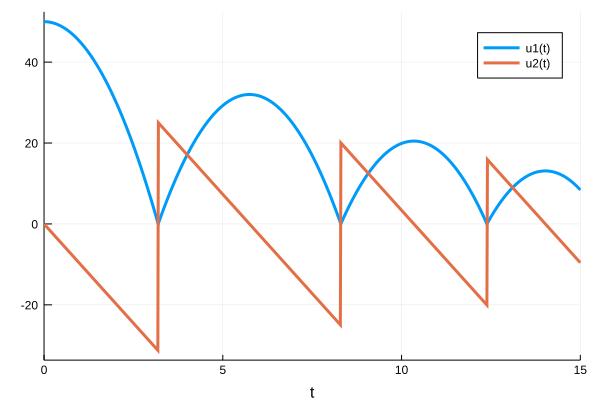

In [5]:
f = function (du,u,p,t)
  du[1] = u[2]
  du[2] = -9.81
end

condtion = function (u,t,integrator) # Event when event_f(t,u,k) == 0
  u[1]
end

affect! = nothing
affect_neg! = function (integrator)
  integrator.u[2] = -0.8integrator.u[2]
end

callback = ContinuousCallback(condtion,affect!,affect_neg!,interp_points=100)

u0 = [50.0,0.0]
tspan = (0.0,15.0)
prob = ODEProblem(f,u0,tspan)


sol = solve(prob,Tsit5(),callback=callback,adaptive=false,dt=1/4)
plot(sol)